### MNIST Dataset

출처 : 나동빈 + 한 줄씩 따라해보는 파이토치 딥러닝 프로젝트 모음집

# 1. 모듈 및 분석 환경 설정

## 1.1 모듈 불러오기

In [4]:
import torch
import torch.nn as nn 

# 딥러닝 네트워크의 기본 구성 요소를 포함한 torch.nn 모듈을 nn으로 지정
 
import torch.nn.functional as F

# 딥러닝에 자주 사용되는 함수가 포함된 모듈 torch.nn.functional을 F로 지정 

import torch.optim as optim

# 가중치 추정에 필요한 최적화 알고리즘을 포함한 모듈 optim

import torchvision

# torchvision은 딥러닝에서 자주 사용되는 데엍네삿과 모델 구조 및 이미지 변환 기술을 포함한다.


import torchvision.transforms as transforms

# torchvision 중 transforms만 불러오기

from matplotlib import pyplot as plt
import seaborn as sn
import pandas as pd
import numpy as np
import os

# device = 'cuda' 쿠다안씀

%matplotlib inline

## 1.2 분석 환경 설정 (GPU)

In [7]:
is_cuda = torch.cuda.is_available()
device = torch.device('cuda' if is_cuda else 'cpu')

# 가중치 업데이트 연산 과정에서 어떤 장비를 선택할지 고르기.
# cuda를 통해 gpu를 사용할 수 있다면 available()에 True 값이, 사용헐 수 없다면 false 값이 저장된다.

Current cuda device cpu


## 1.3 HyperParameter 지정

In [8]:
batch_size = 50 # 모델 가중치를 한 번 업데이트 시킬 떄 사용되는 샘플 단위 개수
epoch_num = 15 # 학습 데이터를 모두 사용하여 학습하는 기본 단위 횟수 ( = Epoch 수)
learning_rate = 0.0001 #가중치 업데이트의 정도

# 2. 데이터 불러오기

## 2.1 MNIST 데이터 불러오기

In [2]:
transform_train = transforms.Compose([
    transforms.ToTensor(),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
])

train_dataset = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform_train)
test_dataset = torchvision.datasets.MNIST(root='./data', train=False, download=True, transform=transform_test)

# Root : Mnist 데이터를 저장할 물리적 공간 위치, './data'는 현재 폴더 위치의 data라는 폴더를 의미함

# train : True/False의 논리값으로 데이터를 학습용으로 사용할 것이닞 지정

# Download : True를 입력하면 root 옵션에서 지정된 위치에 데이터가 저장 . 만약 처음 시행이 아니고 이미 저장된 데이터가 있다면 false 입력

# Mnist 데이터를 저장과 동시에 전처리를 할 수 있는 옵션 ~
# ~ 파이토치는 입력데이터로 Tensor를 사용하으몰 이미지를 Tensor로 변형하는 전처리 Transform.ToTensor()를 사용한다.



1.3%

100.0%


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



100.0%


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100.0%


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



100.0%

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



## 2.2 미니 배치 구성하기

In [10]:
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size= batch_size , shuffle=True, num_workers=4)

test_loader = torch.utils.data.DataLoader(test_dataset, batch_size= batch_size , shuffle=False, num_workers=4)

first_batch = train_loader.__iter__().__next__()

# torch.utils.data.DataLoader는 손쉽게 배치를 구성하며 학습 과정을 반복 시행할 때마다 미니 배치를 하나씩 불러오는 함수이다.

# dataset : 미니 배치로 구성할 데이터

# batch_size : 미니 배치의 사이즈를 나타낸다.

# shuffle : 데이터의 순서를 랜덤으로 섞어서 미니 배치를 구성할 지 여부를 결정한다.~
# ~시계열 데이터가 아닌 경우에는 딥러닝이 데이터 순서에 대해서는 학습하지 못 하도록 데이터를 랜덤으로 섞어주는 것이 필수!이다.


In [15]:
print('{:15s} | {:<25s} | {}'.format('name','type','size'))
print('{:15s} | {:<25s} | {}'.format('Num of Batch','',len(train_loader)))

#1200개의 미니 배치가 생성된 것을 확인 할 수 있다. 그 이유는 60,000개의 학습 데이터에 50 배치 사이즈를 사용했기 때문이다.

name            | type                      | size
Num of Batch    |                           | 1200


# 3. 모델 학습

In [ ]:
# 간단한 CNN을 만들어서 모델을 만들어 보자,
# 모델을 만들기 위해서는 클래스의 __init__을 통해 모델에 사용되는 가중치 형태를 정의한다.
# !!주의!! Layer를 쌓으며서 이전 Layer의 출력 크기와 직후 Layer의 입력 크기를 같게 설계해야 한다는 것.

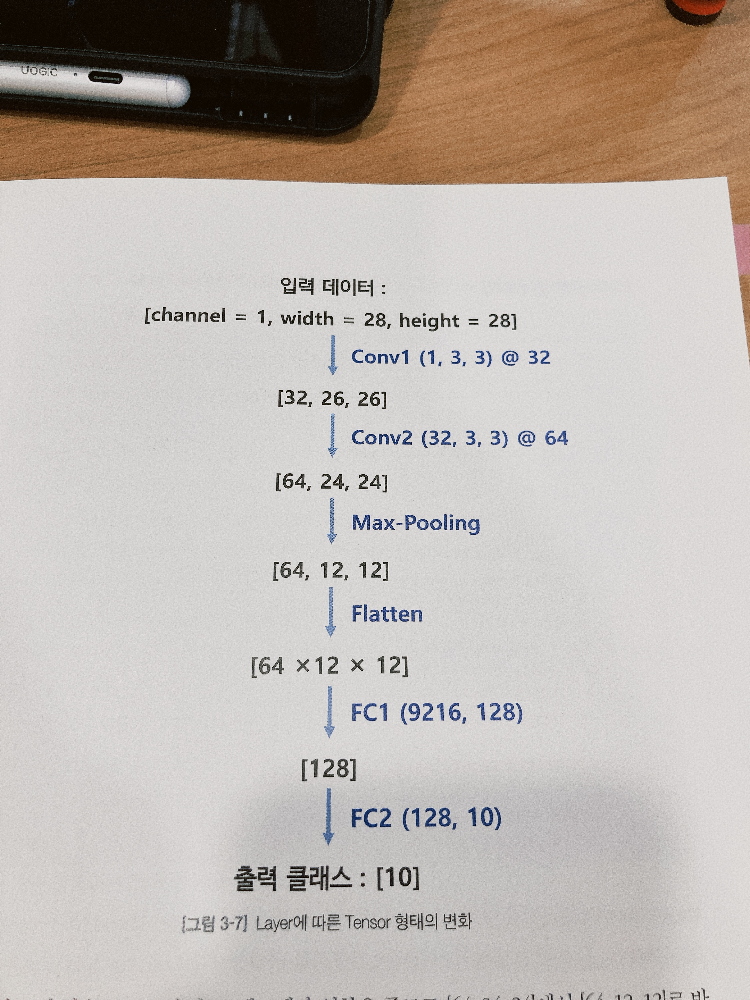

## 3.1 CNN 구조 설계하기

In [37]:
class CNN(nn.Module): #1
    def __init__(self): #2
        super(CNN, self).__init__() #3
        self.conv1 = nn.Conv2d(1,32,3,1) #4
        self.conv2 = nn.Conv2d(32,64,3,1) #5
        self.dropout1 = nn.Dropout2d(0.25) #6
        self.dropout2 = nn.Dropout2d(0.5) #7
        self.fc1 = nn.Linear(9216, 128)   #8
        self.fc2 = nn.Linear(128,10)       #9
        
    def forward(self, x): #10
        x = self.conv1(x) #11
        x = F.relu(x) #12
        x = self.conv2(x) #13
        x = F.relu(x) #14
        x = F.max_pool2d(x,2) # 15
        x = self.dropout1(x) # 16
        x = torch.flatten(x,1) #17
        x = self.fc1(x) # 18
        x = F.relu(x) #19
        x = self.dropout2(x) #20
        x = self.fc2(x) #21
        output = F.log_softmax(x, dim = 1) #22
        return output #23
        


1. CNN 클래스 정의
2. __init__을 통해 모델에서 사용되는 가중치 정의
3. super함수를 nn.module 클래스의 속성을 상속받고 초기화
4. 첫번째 convolutional Layer인 conv1을 정의한다.
각 옵션은 nn.Conv2d ( in_channel = 1, out_channels = 32 , kernel_size = 3 , stride = 1) 이다.
    in_channel은 conv1의 입력 tensor의 채널 크기, 
    out_channel은 conv1의 출력 텐서 크기를 나타낸다.
    kernel_size는 filter의 크기를 나타내는데, Scala 값으로 지정하면 가로와 세로의 크기가 같은 2D filter가 생성된다. 즉 위에서는 3x3 필터임
    stride는 fiter가 움직이는 단위이며, padding 옵션은 지정하지 않았으므로 기본 padding = 0이 적용되어 padding이 시행되지 않음.
    
5. 두 번째 컨볼루션 채널 정의하기. conv1 out과 conv2 in 이 동일한지 확인.

6. 0.25
7. 0.5의 확률의 dropout 지정
8. 첫번째 fully connected Layer인 fc1을 정의한다. 각 옵션은 nn.Linear( in_features = 9216 , in_channers = 128) 
 9216 크기의 벡터를 128 크기의 벡터로 변환하는 가중치를 설계
 
9. fc1에서 출력된 128 크기의 벡터를 minst 클래스 개수인 10크기의 벡터로 변환하는 가중치 설계

------------

10. 입력이미지와 정의한 가중치를 이용해 Feed Forard 연산 정의
11. 입력이미지 conv1 레이어 통과
12. 렐루 활성함수. 활성함수는 단순 연산이므로 __init__에서 정의한 학습 가중치 없음!
13. conv2 레이어 통과하기
14. ReLU 활성함수 적용

15. 2x2 크기의 filter로 maxpooling 적용. 마찬가지로 pooling layer도 단순 연산이므로 학습할 가중치 없음!!
16. 사전에 정의한 0.25 확률의 dropout1을 반영

17. Torch.flatten 함수를 통해 완전 연결 레이어를 통과하기전 고차원 텐서를 1차원 벡터로 변환한다. 2개의 컨볼루션 레이어와 1번의 맥스풀링으로 만들어진 [64,12,12]크기의 3차원 tensor가 9216 크기의 벡터로 변환됨.

18. 9216 크기의 벡터를 128 크기의 벡터로 학습하는 fc1을 통과
19. 렐루
20. 사전정의한 드랍아웃 적용
21. 두 번째 완전 연결 레이어를 통과하면서 벡터의 사이즈가 128에서 10으로 줄어듬
22. 최종 출력 값으로 log-softmax를 계산한다.



## 3.2 Optimaizer 및 손실 함수 정의

In [38]:
model = CNN().to(device)

optimizer = optim.Adam(model.parameters(), lr = learning_rate)

criterion = nn.CrossEntropyLoss()

# CNN 클래스를 이용해 model이라는 인스턴스를 생성한다.

# 손실 함수를 최소로 하는 가중치를 찾기 위해 Adam 알고리즘의 optimizer를 지정

# Mnist는 다중 클래스 분류 문제이기 떄문에 교차엔트로피를 손실함수로 설정한다.

## 3.3 설계한 CNN 모형 확인하기

In [35]:
print(model)# 4.3.3 설계한 CNN 모형 확인하기

CNN(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (dropout1): Dropout2d(p=0.25, inplace=False)
  (dropout2): Dropout2d(p=0.5, inplace=False)
  (fc1): Linear(in_features=9216, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)


## 3.4 모델 학습


In [ ]:
model.train()   #1
i = 0 #2
for epoch in range(epoch_num):  #3
    for data, target in train_loader:  #4
        data = data.to(device) #5
        target = target.to(device) #6
        optimizer.zero_grad() #7
        output = model(data) #8
        loss = criterion(output, target) #9
        loss.backward() #10
        optimizer.step() #11
        if i % 1000 == 0: #12 
            print('Train Step: {}\tLoss: {:.3f}'.format(i, loss.item())) #13
        i += 1 #14

1. 앞서 만든 Cnn 클래스가 저장된 model 인스턴스를 학습 모드로 실행할것을 명시한다.
2. 반복 학습 중 손실 함수 현황을 확인하고 학습횟수를 나타내는 보조인덱스 생성
3. 미리 지정해둔 에포크 (15) 만큼 반복학습 for문 선언
4. 학습데이터를 batch_size로 나눈 만큼 반복 수행되며, train_loader는 매 시행마다 미니 배치의 데이터와 정답을 data와 target에 저장
5. 미니 배치의 데이터를 기존에 저장한 장비 device에 할당
6. 미니 배치의 정답을 기존 지정한 장비 device에 할당
7. 학습 시작 전, 이전 반복 시행에서 저장된 optimizer의 Grad를 초기화한다.
8. data =(미니배치데이터)를 모델에 통과시키는 Feed foward 연산으로 결괏값 계산
9. 계산된 결괏값과 실제 정담으로 손실함수 계산하기
10. 손실함수를 통해 gradient계산
11. 위에서 계산된 gradient를 통해 모델의 가중치 업데이트
12. 학습이 잘 되는지 확인하고자 1000번째 시행마다 손실함수를 확인하는 if문
13. 손실함수 출력
14. 학습완료했기 때문에 보조인덱스 1만큼 올려주기

# 4. 모델 평가

In [41]:
model.eval()
correct = 0 
for data, target in test_loader:
    data = data.to(device)
    target = target.to(device)
    output = model(data)
    prediction = output.data.max(1)[1]
    correct += prediction.eq(target.data).sum()

print('Test set: Accuracy: {:.2f}%'.format(100 * correct/
     len(test_loader.dataset)))

SyntaxError: unexpected EOF while parsing (4132939024.py, line 11)